# 스포츠 분류

https://www.kaggle.com/datasets/gpiosenka/sports-classification

In [1]:
root = './datasets/sports/original/'

In [2]:
from glob import glob
import os



directories = glob(os.path.join(root, '*'))
directory_names = []
for directory in directories:
    directory_names.append(directory[directory.rindex('\\') + 1:])

print(directory_names)

['air hockey', 'ampute football', 'archery', 'arm wrestling', 'axe throwing', 'balance beam', 'barell racing', 'baseball', 'basketball', 'baton twirling', 'bike polo', 'billiards', 'bmx', 'bobsled', 'bowling', 'boxing', 'bull riding', 'bungee jumping', 'canoe slamon', 'cheerleading', 'chuckwagon racing', 'cricket', 'croquet', 'curling', 'disc golf', 'fencing', 'field hockey', 'figure skating men', 'figure skating pairs', 'figure skating women', 'fly fishing', 'football', 'formula 1 racing', 'frisbee', 'gaga', 'giant slalom', 'golf', 'hammer throw', 'hang gliding', 'harness racing', 'high jump', 'hockey', 'horse jumping', 'horse racing', 'horseshoe pitching', 'hurdles', 'hydroplane racing', 'ice climbing', 'ice yachting', 'jai alai', 'javelin', 'jousting', 'judo', 'lacrosse', 'log rolling', 'luge', 'motorcycle racing', 'mushing', 'nascar racing', 'olympic wrestling', 'parallel bar', 'pole climbing', 'pole dancing', 'pole vault', 'polo', 'pommel horse', 'rings', 'rock climbing', 'roller 

In [3]:
for name in directory_names:
    for i, file_name in enumerate(os.listdir(os.path.join(root, name))):
        old_file = os.path.join(root + name + '/', file_name)
        new_file = os.path.join(root + name + '/', name + str(i + 1) + '.png')

        os.rename(old_file, new_file)

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

BATCH_SIZE = 16

image_generator = ImageDataGenerator(rescale = 1./255)

generator = image_generator.flow_from_directory(root, target_size=(244,244), batch_size=BATCH_SIZE, class_mode='categorical')
print(generator.class_indices)

Found 13493 images belonging to 100 classes.
{'air hockey': 0, 'ampute football': 1, 'archery': 2, 'arm wrestling': 3, 'axe throwing': 4, 'balance beam': 5, 'barell racing': 6, 'baseball': 7, 'basketball': 8, 'baton twirling': 9, 'bike polo': 10, 'billiards': 11, 'bmx': 12, 'bobsled': 13, 'bowling': 14, 'boxing': 15, 'bull riding': 16, 'bungee jumping': 17, 'canoe slamon': 18, 'cheerleading': 19, 'chuckwagon racing': 20, 'cricket': 21, 'croquet': 22, 'curling': 23, 'disc golf': 24, 'fencing': 25, 'field hockey': 26, 'figure skating men': 27, 'figure skating pairs': 28, 'figure skating women': 29, 'fly fishing': 30, 'football': 31, 'formula 1 racing': 32, 'frisbee': 33, 'gaga': 34, 'giant slalom': 35, 'golf': 36, 'hammer throw': 37, 'hang gliding': 38, 'harness racing': 39, 'high jump': 40, 'hockey': 41, 'horse jumping': 42, 'horse racing': 43, 'horseshoe pitching': 44, 'hurdles': 45, 'hydroplane racing': 46, 'ice climbing': 47, 'ice yachting': 48, 'jai alai': 49, 'javelin': 50, 'jousti

In [5]:
target_name = {v: k for k, v in generator.class_indices.items()}
target_name

{0: 'air hockey',
 1: 'ampute football',
 2: 'archery',
 3: 'arm wrestling',
 4: 'axe throwing',
 5: 'balance beam',
 6: 'barell racing',
 7: 'baseball',
 8: 'basketball',
 9: 'baton twirling',
 10: 'bike polo',
 11: 'billiards',
 12: 'bmx',
 13: 'bobsled',
 14: 'bowling',
 15: 'boxing',
 16: 'bull riding',
 17: 'bungee jumping',
 18: 'canoe slamon',
 19: 'cheerleading',
 20: 'chuckwagon racing',
 21: 'cricket',
 22: 'croquet',
 23: 'curling',
 24: 'disc golf',
 25: 'fencing',
 26: 'field hockey',
 27: 'figure skating men',
 28: 'figure skating pairs',
 29: 'figure skating women',
 30: 'fly fishing',
 31: 'football',
 32: 'formula 1 racing',
 33: 'frisbee',
 34: 'gaga',
 35: 'giant slalom',
 36: 'golf',
 37: 'hammer throw',
 38: 'hang gliding',
 39: 'harness racing',
 40: 'high jump',
 41: 'hockey',
 42: 'horse jumping',
 43: 'horse racing',
 44: 'horseshoe pitching',
 45: 'hurdles',
 46: 'hydroplane racing',
 47: 'ice climbing',
 48: 'ice yachting',
 49: 'jai alai',
 50: 'javelin',
 5

In [6]:
target_names = []
for target in generator.classes:
    target_names.append(target_name[target])

In [7]:
import pandas as pd

sports_df = pd.DataFrame({'file_paths': generator.filepaths, 'target_names': target_names, 'targets': generator.classes})
sports_df.file_paths = sports_df.file_paths.apply(lambda file_path: file_path.replace('\\', '/'))
sports_df

,file_paths,target_names,targets
0,./datasets/sports/original/air hockey/air hock...,air hockey,0
1,./datasets/sports/original/air hockey/air hock...,air hockey,0
2,./datasets/sports/original/air hockey/air hock...,air hockey,0
3,./datasets/sports/original/air hockey/air hock...,air hockey,0
4,./datasets/sports/original/air hockey/air hock...,air hockey,0
...,...,...,...
13488,./datasets/sports/original/wingsuit flying/win...,wingsuit flying,99
13489,./datasets/sports/original/wingsuit flying/win...,wingsuit flying,99
13490,./datasets/sports/original/wingsuit flying/win...,wingsuit flying,99
13491,./datasets/sports/original/wingsuit flying/win...,wingsuit flying,99


In [8]:
from sklearn.model_selection import train_test_split

train_images,test_images, train_targets, test_targets = \
train_test_split(sports_df.file_paths, 
                 sports_df.targets, 
                 stratify=sports_df.targets, 
                 test_size=0.2, random_state=124)

print(train_targets.value_counts())
print(test_targets.value_counts())

targets
31    153
32    152
58    151
7     139
41    137
     ... 
44     82
3      79
91     78
99     78
77     47
Name: count, Length: 100, dtype: int64
targets
31    38
32    38
58    38
41    35
7     35
      ..
3     20
99    20
44    20
91    19
77    12
Name: count, Length: 100, dtype: int64


In [9]:
from sklearn.model_selection import train_test_split

train_images, validation_images, train_targets, validation_targets = \
train_test_split(train_images, 
                 train_targets, 
                 stratify=train_targets, 
                 test_size=0.2, random_state=124)

print(train_targets.value_counts())
print(validation_targets.value_counts())

targets
31    122
32    122
58    121
7     111
41    110
     ... 
44     66
91     63
3      63
99     62
77     38
Name: count, Length: 100, dtype: int64
targets
31    31
32    30
58    30
7     28
41    27
      ..
94    16
44    16
99    16
91    15
77     9
Name: count, Length: 100, dtype: int64


In [10]:
train_df = sports_df.iloc[train_images.index].reset_index(drop=True)
validation_df = sports_df.iloc[validation_images.index].reset_index(drop=True)
test_df = sports_df.iloc[test_images.index].reset_index(drop=True)
print(train_df.shape)
print(validation_df.shape)
print(test_df.shape)

(8635, 3)
(2159, 3)
(2699, 3)


## 미세 조정을 위한 모델 predict

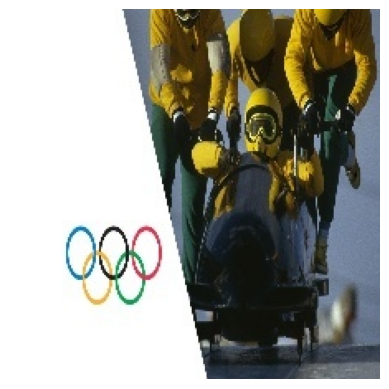

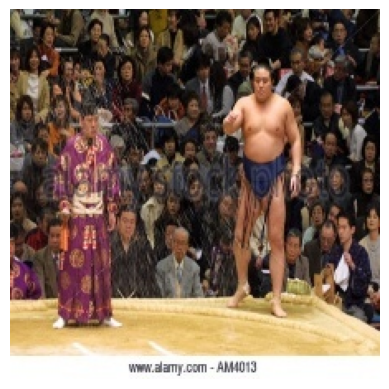

In [25]:
import cv2
import matplotlib.pyplot as plt

image = cv2.cvtColor(cv2.imread(train_df.file_paths.iloc[500]), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.cvtColor(cv2.imread(train_df.file_paths.iloc[100]), cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.axis('off')
plt.show()

In [74]:
IMAGE_SIZE = 244
BATCH_SIZE = 64

In [81]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

# 데이터 세트 생성 class 정의
class Dataset(Sequence):
    # 클래스의 초기화
    # 경로, 타겟, 배치 크기, albumentations 객체, 전처리 하마, 셔플 여부를 인자로 받음
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, preprocess=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.preprocess = preprocess
        self.shuffle = shuffle

        # shuffle True 시 진행:
        if self.shuffle:
            # epoch 끝날 때마다 호출
            self.on_epoch_end()

    # 전체 데이터 세트 크기 반환
    def __len__(self):
        # 하나의 배치 사이즈에 필요한 데이터 개수 리턴
        return int(np.ceil(len(self.targets) / self.batch_size))

    # 주어진 인덱스에 해당하는 배치 반환
    def __getitem__(self, index):
        # 파일 경로와 타겟 데이터를 배치 크기만큼 자르고, 이미지를 불러와 처리한 후 배치로 반환
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]

        # 데이터 배치 저장
        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        # 데이터 수만큼 반복
        for i in range(file_paths_batch.shape[0]):
            # RGB로 색상 형식을 변환하여 이미지 가져오기
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            # 이미지 크기 조정
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            # albumentations이 있다면:
            if self.aug is not None:
                # Augmentor 객체로 이미지 변환
                image = self.aug(image=image)['image']

            # 전처리 함수가 있다면:
            if self.preprocess is not None:
                # 이미지 전처리 진행
                image = self.preprocess(image)

            # 결과 배치에 이미지를 저장
            results_batch[i] = image

        # 결과 배치와 타겟 배치를 반환
        return results_batch, targets_batch
        
    def on_epoch_end(self):
        # shuffle 옵션이 켜져있다면, 데이터를 섞기
        if self.shuffle:
            # epoch 끝날 때마다 데이터 섞기
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)

In [82]:
def create_dataset(paths, targets, BATCH_SIZE, shuffle=True):   
    return Dataset(paths,
                   targets,
                   batch_size=BATCH_SIZE,
                   shuffle=True)

In [90]:
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt

from tensorflow.keras.applications.vgg16 import VGG16, decode_predictions as vgg16_decode_predictions
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, decode_predictions as resnet50v2_decode_predictions
from tensorflow.keras.applications.xception import Xception, decode_predictions as xception_decode_predictions
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, decode_predictions as mobilenetv2_decode_predictions

def predict_and_display(images, titles, model_name):
    nrows = len(images) // 10 + int(len(images) % 10 != 0)  # 이미지 개수에 따라 행 개수 계산
    figure, axs = plt.subplots(figsize=(22, 4 * nrows), nrows=nrows, ncols=10)

    # VGG16 모델 선택
    if model_name == 'vgg16':
        model = VGG16()
        decode_predictions = vgg16_decode_predictions
        target_size = (224, 224)
    # ResNet50V2 모델 선택
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2()
        decode_predictions = resnet50v2_decode_predictions
        target_size = (224, 224)
    # Xception 모델 선택
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception()
        decode_predictions = xception_decode_predictions
        target_size = (299, 299)
    # MobileNetV2 모델 선택
    elif model_name == 'mobilenet':
        model = MobileNetV2()
        decode_predictions = mobilenetv2_decode_predictions
        target_size = (224, 224)

    for i, (image, title) in enumerate(zip(images, titles)):
        # 모델 입력 크기에 맞게 이미지 크기 조정
        resized_image = cv2.resize(image, target_size)
        # 이미지 배열로 변환
        image_array = img_to_array(resized_image)
        # 차원 확장 (배열의 첫 번째 차원 확장)
        image_array = np.expand_dims(image_array, axis=0)
        # 이미지 예측
        prediction = model.predict(image_array)
        # 이미지 분류 모델의 예측 결과를 해석
        target = decode_predictions(prediction)
        # 높은 확률로 예측된 클래스 이름과 확률
        predicted_class = target[0][0][1]
        predicted_probability = np.round(target[0][0][2] * 100, 2)
        
        # 이미지와 예측 결과 표시
        row_index = i // 10
        col_index = i % 10
        axs[row_index, col_index].imshow(image.astype('int'))
        axs[row_index, col_index].axis('off')
        axs[row_index, col_index].set_title(f"{predicted_class}\n{predicted_probability}%")

        print(target)
    
    # 빈 공간에 대한 처리
    for i in range(len(images), nrows * 10):
        row_index = i // 10
        col_index = i % 10
        axs[row_index, col_index].axis('off')
        axs[row_index, col_index].set_title("")


In [84]:
import matplotlib.pyplot as plt

def show_images(files_batch, ncols=4, title=None):    
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    
    for i in range(ncols):
        # files_batch는 float이므로 int로 변경
        axs[i].imshow(np.array(files_batch[i], dtype='int32'))
        axs[i].axis('off')
        axs[i].set_title(title[i]) 

In [85]:
import albumentations as A

# 각 클래스에서 하나씩 이미지를 샘플링하여 균등한 배치 구성
sampled_df = test_df.groupby('targets', group_keys=False).apply(lambda x: x.sample(1))

# 데이터 경로 및 타겟 담기 (get_dummies를 통해 원-핫 인코딩 진행)
sampled_file_paths = sampled_df['file_paths'].values
sampled_targets = pd.get_dummies(sampled_df['targets']).values # CategoricalCrossEntropy

In [86]:
dataset = create_dataset(sampled_file_paths, sampled_targets, BATCH_SIZE, shuffle=True)

In [87]:
files_batch, targets_batch = next(iter(dataset))
# 레이블 인코딩시, target 차원을 2차원으로 맞춰줘야 한다.
print(files_batch.shape, targets_batch.shape)

(64, 244, 244, 3) (64, 100)


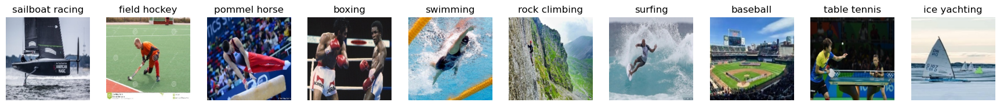

In [88]:
# 이미지 제목 생성
titles = [target_name[np.argmax(target)] for target in targets_batch]

# 정답 출력
show_images(files_batch, ncols=10, title=titles)

vgg16
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
[[('n04483307', 'trimaran', 0.77225846), ('n02981792', 'catamaran', 0.1416561), ('n04273569', 'speedboat', 0.0638404), ('n04612504', 'yawl', 0.014713327), ('n02704792', 'amphibian', 0.004088917)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
[[('n04540053', 'volleyball', 0.2932579), ('n04039381', 'racket', 0.20622705), ('n09835506', 'ballplayer', 0.08572474), ('n04254680', 'soccer_ball', 0.06617652), ('n04149813', 'scoreboard', 0.06357673)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step
[[('n03888605', 'parallel_bars', 0.25327232), ('n03535780', 'horizontal_bar', 0.084959686), ('n02777292', 'balance_beam', 0.06769372), ('n03873416', 'paddle', 0.04036018), ('n03944341', 'pinwheel', 0.039003614)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
[[('n03888605', 'parallel_bars', 0.51636344), ('n03535780', 'horizontal_bar', 0.42558828), ('n04540053', 'volleyball', 0.028221982), ('n02802426', 'basketball', 0.013608308), ('n02777292', 'balance_beam', 0.012955081)]]
1/1 ━━━

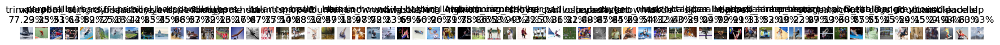

In [89]:
# 예측 모델 출력
print('vgg16')
predict_and_display(files_batch, titles, 'vgg16')

mobilenet
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04067472', 'reel', 0.076654285), ('n03874599', 'padlock', 0.066095844), ('n04517823', 'vacuum', 0.06388865), ('n03424325', 'gasmask', 0.06053513), ('n04275548', 'spider_web', 0.049929917)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02219486', 'ant', 0.9629554), ('n01774384', 'black_widow', 0.0058097956), ('n01770393', 'scorpion', 0.005176215), ('n01775062', 'wolf_spider', 0.002837928), ('n01774750', 'tarantula', 0.0027633663)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.3248808), ('n02672831', 'accordion', 0.048861817), ('n03854065', 'organ', 0.029701624), ('n03637318', 'lampshade', 0.028033586), ('n04505470', 'typewriter_keyboard', 0.015348619)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04254777', 'sock', 0.19058575), ('n04120489', 'running_shoe', 0.08019683), ('n03450230', 'gown', 0.06064073), ('n04370456', 'sweatshirt', 0.03278743), ('n04399382', 'teddy', 0.021850271)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.052505847), ('n03874599', 'padlock', 0.038457245), ('n03028079', 'church', 0.024327673), ('n03532672', 'hook', 0.02396793), ('n04507155', 'umbrella', 0.021613989)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.03083899), ('n04243546', 'slot', 0.03009988), ('n04589890', 'window_screen', 0.029186398), ('n02895154', 'breastplate', 0.025022175), ('n03028079', 'church', 0.024714025)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.16923177), ('n03729826', 'matchstick', 0.02291958), ('n04590129', 'window_shade', 0.022829736), ('n04074963', 'remote_control', 0.02085807), ('n03028079', 'church', 0.016872348)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03857828', 'oscilloscope', 0.33758923), ('n04152593', 'screen', 0.07091072), ('n03782006', 'monitor', 0.057641964), ('n03691459', 'loudspeaker', 0.034361403), ('n04204347', 'shopping_cart', 0.02382025)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03584829', 'iron', 0.2912136), ('n04372370', 'switch', 0.23711616), ('n03187595', 'dial_telephone', 0.01680551), ('n04517823', 'vacuum', 0.015435955), ('n03902125', 'pay-phone', 0.013267991)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.074238576), ('n03724870', 'mask', 0.035487466), ('n04200800', 'shoe_shop', 0.019670626), ('n03854065', 'organ', 0.01944791), ('n03530642', 'honeycomb', 0.016005207)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.33699495), ('n03255030', 'dumbbell', 0.054585297), ('n04517823', 'vacuum', 0.025464617), ('n04591157', 'Windsor_tie', 0.02332909), ('n04507155', 'umbrella', 0.022041667)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04507155', 'umbrella', 0.062229373), ('n03028079', 'church', 0.054260653), ('n03724870', 'mask', 0.047643077), ('n02699494', 'altar', 0.045282677), ('n03457902', 'greenhouse', 0.041958205)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03888257', 'parachute', 0.08521144), ('n03124170', 'cowboy_hat', 0.06453421), ('n04259630', 'sombrero', 0.054901183), ('n03637318', 'lampshade', 0.027640345), ('n04590129', 'window_shade', 0.023674019)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.32823545), ('n03032252', 'cinema', 0.028966371), ('n03874599', 'padlock', 0.020937545), ('n02930766', 'cab', 0.018016683), ('n02895154', 'breastplate', 0.01184628)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04589890', 'window_screen', 0.12925039), ('n03637318', 'lampshade', 0.112120464), ('n04590129', 'window_shade', 0.05419455), ('n04286575', 'spotlight', 0.03134513), ('n04507155', 'umbrella', 0.029295243)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04404412', 'television', 0.057279397), ('n03388183', 'fountain_pen', 0.048400868), ('n04286575', 'spotlight', 0.035903856), ('n03347037', 'fire_screen', 0.034948036), ('n02783161', 'ballpoint', 0.034492705)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03272010', 'electric_guitar', 0.25396845), ('n04296562', 'stage', 0.24387737), ('n04418357', 'theater_curtain', 0.048345733), ('n04509417', 'unicycle', 0.042639297), ('n03627232', 'knot', 0.023042496)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03724870', 'mask', 0.055192243), ('n03457902', 'greenhouse', 0.04494185), ('n02895154', 'breastplate', 0.030464472), ('n03983396', 'pop_bottle', 0.02979541), ('n03028079', 'church', 0.027735865)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.12070958), ('n03874599', 'padlock', 0.08295532), ('n02999410', 'chain', 0.054016024), ('n03733281', 'maze', 0.040410426), ('n04120489', 'running_shoe', 0.034363564)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.083764896), ('n02971356', 'carton', 0.08331353), ('n04589890', 'window_screen', 0.070558034), ('n03637318', 'lampshade', 0.049196437), ('n03691459', 'loudspeaker', 0.034557994)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.39052576), ('n04589890', 'window_screen', 0.051759996), ('n03857828', 'oscilloscope', 0.034721576), ('n03347037', 'fire_screen', 0.030436417), ('n03584829', 'iron', 0.017987646)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04507155', 'umbrella', 0.11684523), ('n03627232', 'knot', 0.10597826), ('n03891332', 'parking_meter', 0.06270937), ('n02966193', 'carousel', 0.04818735), ('n03874599', 'padlock', 0.041997682)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n06596364', 'comic_book', 0.085909605), ('n04120489', 'running_shoe', 0.06761723), ('n04557648', 'water_bottle', 0.035397936), ('n03733281', 'maze', 0.030406242), ('n03180011', 'desktop_computer', 0.028229037)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03938244', 'pillow', 0.13076413), ('n04507155', 'umbrella', 0.036350496), ('n03998194', 'prayer_rug', 0.021916756), ('n02795169', 'barrel', 0.019827962), ('n03457902', 'greenhouse', 0.015403721)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04590129', 'window_shade', 0.12311724), ('n03874599', 'padlock', 0.06262894), ('n03637318', 'lampshade', 0.041924942), ('n03916031', 'perfume', 0.040676147), ('n03532672', 'hook', 0.04020281)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03598930', 'jigsaw_puzzle', 0.22041391), ('n04418357', 'theater_curtain', 0.077309124), ('n09835506', 'ballplayer', 0.058301922), ('n03998194', 'prayer_rug', 0.029419813), ('n02098286', 'West_Highland_white_terrier', 0.02801165)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04356056', 'sunglasses', 0.031775445), ('n03724870', 'mask', 0.030171143), ('n03874599', 'padlock', 0.027389582), ('n02699494', 'altar', 0.024576219), ('n03530642', 'honeycomb', 0.022355365)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04557648', 'water_bottle', 0.095685795), ('n04127249', 'safety_pin', 0.093822226), ('n04204347', 'shopping_cart', 0.053448502), ('n03874599', 'padlock', 0.04852499), ('n01806143', 'peacock', 0.03603608)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04286575', 'spotlight', 0.10701272), ('n04152593', 'screen', 0.08719638), ('n03637318', 'lampshade', 0.039854523), ('n03868863', 'oxygen_mask', 0.038114388), ('n06874185', 'traffic_light', 0.028835487)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.19254988), ('n02841315', 'binoculars', 0.1613606), ('n03627232', 'knot', 0.044486076), ('n03602883', 'joystick', 0.02419963), ('n03255030', 'dumbbell', 0.017506454)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02699494', 'altar', 0.061059684), ('n03874599', 'padlock', 0.045274343), ('n04418357', 'theater_curtain', 0.03803878), ('n03998194', 'prayer_rug', 0.017200379), ('n03000134', 'chainlink_fence', 0.01603098)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04033995', 'quilt', 0.23860654), ('n03938244', 'pillow', 0.03406957), ('n15075141', 'toilet_tissue', 0.03152446), ('n04517823', 'vacuum', 0.029193396), ('n03424325', 'gasmask', 0.02918304)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03637318', 'lampshade', 0.15463816), ('n03733281', 'maze', 0.12561435), ('n04591157', 'Windsor_tie', 0.06567456), ('n04286575', 'spotlight', 0.036242574), ('n04033995', 'quilt', 0.028715378)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03457902', 'greenhouse', 0.08949814), ('n03874599', 'padlock', 0.060712766), ('n02317335', 'starfish', 0.020450877), ('n06596364', 'comic_book', 0.018028656), ('n04209239', 'shower_curtain', 0.016037619)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.10263029), ('n02999410', 'chain', 0.055458132), ('n04254777', 'sock', 0.029185902), ('n03627232', 'knot', 0.027656714), ('n03141823', 'crutch', 0.019608501)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03457902', 'greenhouse', 0.07456883), ('n03733281', 'maze', 0.06739277), ('n03874599', 'padlock', 0.02824157), ('n03028079', 'church', 0.027660273), ('n03791053', 'motor_scooter', 0.018837795)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03908618', 'pencil_box', 0.06786199), ('n02966193', 'carousel', 0.05570358), ('n03724870', 'mask', 0.040823475), ('n04120489', 'running_shoe', 0.03959791), ('n04259630', 'sombrero', 0.030380642)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.10351843), ('n04591157', 'Windsor_tie', 0.06407787), ('n06596364', 'comic_book', 0.048251793), ('n03733281', 'maze', 0.034968205), ('n03857828', 'oscilloscope', 0.0245964)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02930766', 'cab', 0.075576365), ('n04356056', 'sunglasses', 0.06841985), ('n04162706', 'seat_belt', 0.04056381), ('n04209239', 'shower_curtain', 0.039682616), ('n03255030', 'dumbbell', 0.035894252)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.38733262), ('n04372370', 'switch', 0.058068562), ('n04070727', 'refrigerator', 0.04446263), ('n03874599', 'padlock', 0.028325645), ('n03916031', 'perfume', 0.02670625)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.16141655), ('n03874599', 'padlock', 0.06606751), ('n03457902', 'greenhouse', 0.02763833), ('n03530642', 'honeycomb', 0.023362756), ('n04200800', 'shoe_shop', 0.021258494)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n06596364', 'comic_book', 0.11393638), ('n03804744', 'nail', 0.06824389), ('n04418357', 'theater_curtain', 0.030291189), ('n03720891', 'maraca', 0.02938172), ('n03791053', 'motor_scooter', 0.01759704)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03598930', 'jigsaw_puzzle', 0.32426772), ('n03733281', 'maze', 0.06444935), ('n04286575', 'spotlight', 0.062468722), ('n03874599', 'padlock', 0.035633884), ('n04296562', 'stage', 0.02709857)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.41538283), ('n02966193', 'carousel', 0.028114233), ('n03532672', 'hook', 0.018937645), ('n03876231', 'paintbrush', 0.017007096), ('n03908618', 'pencil_box', 0.014915722)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.10343646), ('n03733281', 'maze', 0.043581963), ('n03457902', 'greenhouse', 0.041782364), ('n04116512', 'rubber_eraser', 0.04121017), ('n04507155', 'umbrella', 0.03180689)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02667093', 'abaya', 0.105252065), ('n03637318', 'lampshade', 0.0632069), ('n03347037', 'fire_screen', 0.04162131), ('n03733281', 'maze', 0.039906207), ('n04286575', 'spotlight', 0.03412708)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.17831552), ('n03532672', 'hook', 0.07588913), ('n02999410', 'chain', 0.053422384), ('n03627232', 'knot', 0.02907273), ('n03180011', 'desktop_computer', 0.023738515)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02966687', "carpenter's_kit", 0.40472633), ('n03854065', 'organ', 0.047592457), ('n04418357', 'theater_curtain', 0.04444733), ('n03028079', 'church', 0.03541922), ('n03032252', 'cinema', 0.03415289)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.07807079), ('n03598930', 'jigsaw_puzzle', 0.041097395), ('n03627232', 'knot', 0.041051254), ('n06596364', 'comic_book', 0.03648525), ('n04116512', 'rubber_eraser', 0.03103523)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.47651303), ('n04296562', 'stage', 0.040305432), ('n09229709', 'bubble', 0.03937356), ('n04590129', 'window_shade', 0.020945476), ('n04462240', 'toyshop', 0.012983104)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04033995', 'quilt', 0.19204539), ('n03782006', 'monitor', 0.038689375), ('n04507155', 'umbrella', 0.037415266), ('n03938244', 'pillow', 0.032836802), ('n04152593', 'screen', 0.03146851)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.14179161), ('n03782006', 'monitor', 0.09631643), ('n04120489', 'running_shoe', 0.04254178), ('n04152593', 'screen', 0.03360789), ('n03627232', 'knot', 0.031883765)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.087172106), ('n02966687', "carpenter's_kit", 0.055843405), ('n04209239', 'shower_curtain', 0.040012565), ('n04296562', 'stage', 0.027624657), ('n04507155', 'umbrella', 0.026868623)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.30406058), ('n03874599', 'padlock', 0.037668858), ('n04243546', 'slot', 0.03072546), ('n03637318', 'lampshade', 0.016247274), ('n02999410', 'chain', 0.01592312)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03424325', 'gasmask', 0.055226915), ('n03637318', 'lampshade', 0.033664756), ('n03916031', 'perfume', 0.030385232), ('n03733281', 'maze', 0.022774737), ('n04507155', 'umbrella', 0.02275128)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.2636545), ('n02782093', 'balloon', 0.041824035), ('n03676483', 'lipstick', 0.039184704), ('n04418357', 'theater_curtain', 0.02603014), ('n03916031', 'perfume', 0.023355862)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.12758121), ('n03874599', 'padlock', 0.09654203), ('n03733281', 'maze', 0.041428387), ('n04418357', 'theater_curtain', 0.02230317), ('n06874185', 'traffic_light', 0.021956157)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03127747', 'crash_helmet', 0.32114908), ('n02769748', 'backpack', 0.04071866), ('n03459775', 'grille', 0.028971236), ('n03347037', 'fire_screen', 0.028838258), ('n04254680', 'soccer_ball', 0.02169898)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02895154', 'breastplate', 0.22125721), ('n04286575', 'spotlight', 0.06377529), ('n03724870', 'mask', 0.05965029), ('n04418357', 'theater_curtain', 0.025596142), ('n06596364', 'comic_book', 0.021615218)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.43311876), ('n03854065', 'organ', 0.06958831), ('n03627232', 'knot', 0.011043843), ('n04591157', 'Windsor_tie', 0.010587565), ('n03908618', 'pencil_box', 0.0068643773)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.12201228), ('n03627232', 'knot', 0.06633847), ('n03857828', 'oscilloscope', 0.054313432), ('n03676483', 'lipstick', 0.032157604), ('n03720891', 'maraca', 0.026038878)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04153751', 'screw', 0.1060891), ('n03804744', 'nail', 0.09017444), ('n04507155', 'umbrella', 0.02142472), ('n03874599', 'padlock', 0.021351103), ('n04154565', 'screwdriver', 0.01912976)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03388183', 'fountain_pen', 0.35884893), ('n04286575', 'spotlight', 0.0827836), ('n04328186', 'stopwatch', 0.03119936), ('n03483316', 'hand_blower', 0.022112606), ('n04589890', 'window_screen', 0.019167267)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.36356127), ('n04418357', 'theater_curtain', 0.21160883), ('n02999410', 'chain', 0.07948692), ('n03874599', 'padlock', 0.048720513), ('n04590129', 'window_shade', 0.023814568)]]


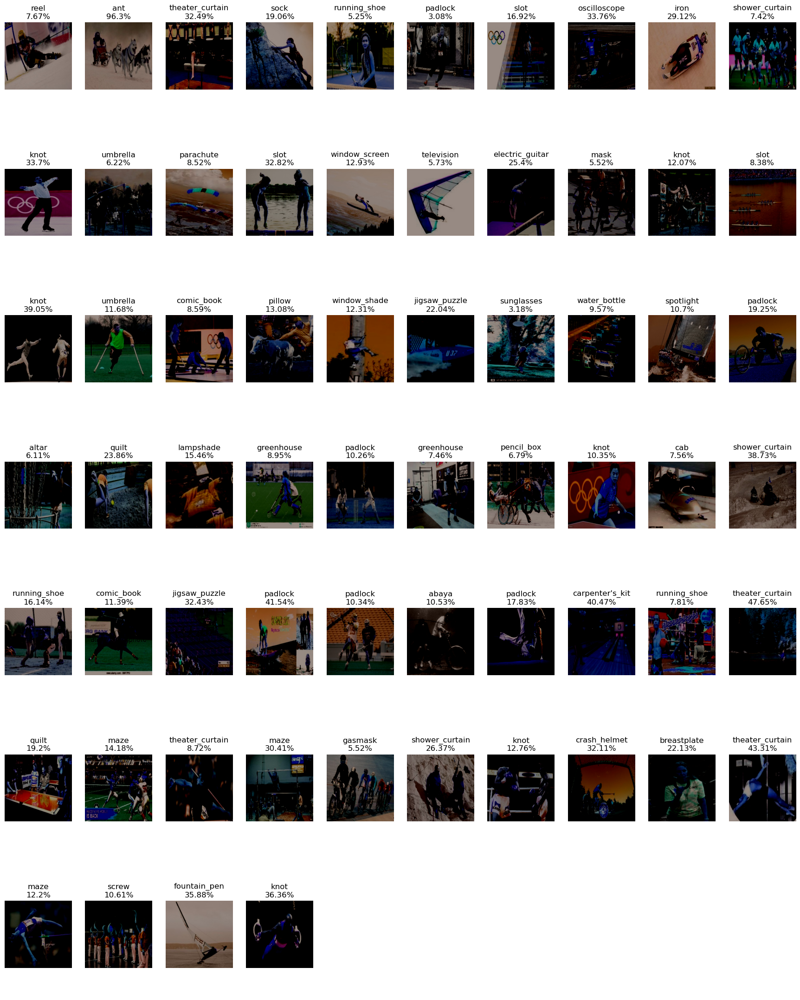

In [39]:
# 예측 모델 출력
print('mobilenet')
predict_and_display(files_batch, titles, 'mobilenet')

mobilenet
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 841ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04067472', 'reel', 0.076654285), ('n03874599', 'padlock', 0.066095844), ('n04517823', 'vacuum', 0.06388865), ('n03424325', 'gasmask', 0.06053513), ('n04275548', 'spider_web', 0.049929917)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02219486', 'ant', 0.9629554), ('n01774384', 'black_widow', 0.0058097956), ('n01770393', 'scorpion', 0.005176215), ('n01775062', 'wolf_spider', 0.002837928), ('n01774750', 'tarantula', 0.0027633663)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.3248808), ('n02672831', 'accordion', 0.048861817), ('n03854065', 'organ', 0.029701624), ('n03637318', 'lampshade', 0.028033586), ('n04505470', 'typewriter_keyboard', 0.015348619)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04254777', 'sock', 0.19058575), ('n04120489', 'running_shoe', 0.08019683), ('n03450230', 'gown', 0.06064073), ('n04370456', 'sweatshirt', 0.03278743), ('n04399382', 'teddy', 0.021850271)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.052505847), ('n03874599', 'padlock', 0.038457245), ('n03028079', 'church', 0.024327673), ('n03532672', 'hook', 0.02396793), ('n04507155', 'umbrella', 0.021613989)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.03083899), ('n04243546', 'slot', 0.03009988), ('n04589890', 'window_screen', 0.029186398), ('n02895154', 'breastplate', 0.025022175), ('n03028079', 'church', 0.024714025)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.16923177), ('n03729826', 'matchstick', 0.02291958), ('n04590129', 'window_shade', 0.022829736), ('n04074963', 'remote_control', 0.02085807), ('n03028079', 'church', 0.016872348)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03857828', 'oscilloscope', 0.33758923), ('n04152593', 'screen', 0.07091072), ('n03782006', 'monitor', 0.057641964), ('n03691459', 'loudspeaker', 0.034361403), ('n04204347', 'shopping_cart', 0.02382025)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03584829', 'iron', 0.2912136), ('n04372370', 'switch', 0.23711616), ('n03187595', 'dial_telephone', 0.01680551), ('n04517823', 'vacuum', 0.015435955), ('n03902125', 'pay-phone', 0.013267991)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.074238576), ('n03724870', 'mask', 0.035487466), ('n04200800', 'shoe_shop', 0.019670626), ('n03854065', 'organ', 0.01944791), ('n03530642', 'honeycomb', 0.016005207)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.33699495), ('n03255030', 'dumbbell', 0.054585297), ('n04517823', 'vacuum', 0.025464617), ('n04591157', 'Windsor_tie', 0.02332909), ('n04507155', 'umbrella', 0.022041667)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04507155', 'umbrella', 0.062229373), ('n03028079', 'church', 0.054260653), ('n03724870', 'mask', 0.047643077), ('n02699494', 'altar', 0.045282677), ('n03457902', 'greenhouse', 0.041958205)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03888257', 'parachute', 0.08521144), ('n03124170', 'cowboy_hat', 0.06453421), ('n04259630', 'sombrero', 0.054901183), ('n03637318', 'lampshade', 0.027640345), ('n04590129', 'window_shade', 0.023674019)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.32823545), ('n03032252', 'cinema', 0.028966371), ('n03874599', 'padlock', 0.020937545), ('n02930766', 'cab', 0.018016683), ('n02895154', 'breastplate', 0.01184628)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04589890', 'window_screen', 0.12925039), ('n03637318', 'lampshade', 0.112120464), ('n04590129', 'window_shade', 0.05419455), ('n04286575', 'spotlight', 0.03134513), ('n04507155', 'umbrella', 0.029295243)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04404412', 'television', 0.057279397), ('n03388183', 'fountain_pen', 0.048400868), ('n04286575', 'spotlight', 0.035903856), ('n03347037', 'fire_screen', 0.034948036), ('n02783161', 'ballpoint', 0.034492705)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03272010', 'electric_guitar', 0.25396845), ('n04296562', 'stage', 0.24387737), ('n04418357', 'theater_curtain', 0.048345733), ('n04509417', 'unicycle', 0.042639297), ('n03627232', 'knot', 0.023042496)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03724870', 'mask', 0.055192243), ('n03457902', 'greenhouse', 0.04494185), ('n02895154', 'breastplate', 0.030464472), ('n03983396', 'pop_bottle', 0.02979541), ('n03028079', 'church', 0.027735865)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.12070958), ('n03874599', 'padlock', 0.08295532), ('n02999410', 'chain', 0.054016024), ('n03733281', 'maze', 0.040410426), ('n04120489', 'running_shoe', 0.034363564)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04243546', 'slot', 0.083764896), ('n02971356', 'carton', 0.08331353), ('n04589890', 'window_screen', 0.070558034), ('n03637318', 'lampshade', 0.049196437), ('n03691459', 'loudspeaker', 0.034557994)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.39052576), ('n04589890', 'window_screen', 0.051759996), ('n03857828', 'oscilloscope', 0.034721576), ('n03347037', 'fire_screen', 0.030436417), ('n03584829', 'iron', 0.017987646)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04507155', 'umbrella', 0.11684523), ('n03627232', 'knot', 0.10597826), ('n03891332', 'parking_meter', 0.06270937), ('n02966193', 'carousel', 0.04818735), ('n03874599', 'padlock', 0.041997682)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n06596364', 'comic_book', 0.085909605), ('n04120489', 'running_shoe', 0.06761723), ('n04557648', 'water_bottle', 0.035397936), ('n03733281', 'maze', 0.030406242), ('n03180011', 'desktop_computer', 0.028229037)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03938244', 'pillow', 0.13076413), ('n04507155', 'umbrella', 0.036350496), ('n03998194', 'prayer_rug', 0.021916756), ('n02795169', 'barrel', 0.019827962), ('n03457902', 'greenhouse', 0.015403721)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04590129', 'window_shade', 0.12311724), ('n03874599', 'padlock', 0.06262894), ('n03637318', 'lampshade', 0.041924942), ('n03916031', 'perfume', 0.040676147), ('n03532672', 'hook', 0.04020281)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03598930', 'jigsaw_puzzle', 0.22041391), ('n04418357', 'theater_curtain', 0.077309124), ('n09835506', 'ballplayer', 0.058301922), ('n03998194', 'prayer_rug', 0.029419813), ('n02098286', 'West_Highland_white_terrier', 0.02801165)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04356056', 'sunglasses', 0.031775445), ('n03724870', 'mask', 0.030171143), ('n03874599', 'padlock', 0.027389582), ('n02699494', 'altar', 0.024576219), ('n03530642', 'honeycomb', 0.022355365)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04557648', 'water_bottle', 0.095685795), ('n04127249', 'safety_pin', 0.093822226), ('n04204347', 'shopping_cart', 0.053448502), ('n03874599', 'padlock', 0.04852499), ('n01806143', 'peacock', 0.03603608)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04286575', 'spotlight', 0.10701272), ('n04152593', 'screen', 0.08719638), ('n03637318', 'lampshade', 0.039854523), ('n03868863', 'oxygen_mask', 0.038114388), ('n06874185', 'traffic_light', 0.028835487)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.19254988), ('n02841315', 'binoculars', 0.1613606), ('n03627232', 'knot', 0.044486076), ('n03602883', 'joystick', 0.02419963), ('n03255030', 'dumbbell', 0.017506454)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02699494', 'altar', 0.061059684), ('n03874599', 'padlock', 0.045274343), ('n04418357', 'theater_curtain', 0.03803878), ('n03998194', 'prayer_rug', 0.017200379), ('n03000134', 'chainlink_fence', 0.01603098)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04033995', 'quilt', 0.23860654), ('n03938244', 'pillow', 0.03406957), ('n15075141', 'toilet_tissue', 0.03152446), ('n04517823', 'vacuum', 0.029193396), ('n03424325', 'gasmask', 0.02918304)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03637318', 'lampshade', 0.15463816), ('n03733281', 'maze', 0.12561435), ('n04591157', 'Windsor_tie', 0.06567456), ('n04286575', 'spotlight', 0.036242574), ('n04033995', 'quilt', 0.028715378)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03457902', 'greenhouse', 0.08949814), ('n03874599', 'padlock', 0.060712766), ('n02317335', 'starfish', 0.020450877), ('n06596364', 'comic_book', 0.018028656), ('n04209239', 'shower_curtain', 0.016037619)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.10263029), ('n02999410', 'chain', 0.055458132), ('n04254777', 'sock', 0.029185902), ('n03627232', 'knot', 0.027656714), ('n03141823', 'crutch', 0.019608501)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03457902', 'greenhouse', 0.07456883), ('n03733281', 'maze', 0.06739277), ('n03874599', 'padlock', 0.02824157), ('n03028079', 'church', 0.027660273), ('n03791053', 'motor_scooter', 0.018837795)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03908618', 'pencil_box', 0.06786199), ('n02966193', 'carousel', 0.05570358), ('n03724870', 'mask', 0.040823475), ('n04120489', 'running_shoe', 0.03959791), ('n04259630', 'sombrero', 0.030380642)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.10351843), ('n04591157', 'Windsor_tie', 0.06407787), ('n06596364', 'comic_book', 0.048251793), ('n03733281', 'maze', 0.034968205), ('n03857828', 'oscilloscope', 0.0245964)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02930766', 'cab', 0.075576365), ('n04356056', 'sunglasses', 0.06841985), ('n04162706', 'seat_belt', 0.04056381), ('n04209239', 'shower_curtain', 0.039682616), ('n03255030', 'dumbbell', 0.035894252)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.38733262), ('n04372370', 'switch', 0.058068562), ('n04070727', 'refrigerator', 0.04446263), ('n03874599', 'padlock', 0.028325645), ('n03916031', 'perfume', 0.02670625)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.16141655), ('n03874599', 'padlock', 0.06606751), ('n03457902', 'greenhouse', 0.02763833), ('n03530642', 'honeycomb', 0.023362756), ('n04200800', 'shoe_shop', 0.021258494)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n06596364', 'comic_book', 0.11393638), ('n03804744', 'nail', 0.06824389), ('n04418357', 'theater_curtain', 0.030291189), ('n03720891', 'maraca', 0.02938172), ('n03791053', 'motor_scooter', 0.01759704)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03598930', 'jigsaw_puzzle', 0.32426772), ('n03733281', 'maze', 0.06444935), ('n04286575', 'spotlight', 0.062468722), ('n03874599', 'padlock', 0.035633884), ('n04296562', 'stage', 0.02709857)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.41538283), ('n02966193', 'carousel', 0.028114233), ('n03532672', 'hook', 0.018937645), ('n03876231', 'paintbrush', 0.017007096), ('n03908618', 'pencil_box', 0.014915722)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.10343646), ('n03733281', 'maze', 0.043581963), ('n03457902', 'greenhouse', 0.041782364), ('n04116512', 'rubber_eraser', 0.04121017), ('n04507155', 'umbrella', 0.03180689)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02667093', 'abaya', 0.105252065), ('n03637318', 'lampshade', 0.0632069), ('n03347037', 'fire_screen', 0.04162131), ('n03733281', 'maze', 0.039906207), ('n04286575', 'spotlight', 0.03412708)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03874599', 'padlock', 0.17831552), ('n03532672', 'hook', 0.07588913), ('n02999410', 'chain', 0.053422384), ('n03627232', 'knot', 0.02907273), ('n03180011', 'desktop_computer', 0.023738515)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02966687', "carpenter's_kit", 0.40472633), ('n03854065', 'organ', 0.047592457), ('n04418357', 'theater_curtain', 0.04444733), ('n03028079', 'church', 0.03541922), ('n03032252', 'cinema', 0.03415289)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04120489', 'running_shoe', 0.07807079), ('n03598930', 'jigsaw_puzzle', 0.041097395), ('n03627232', 'knot', 0.041051254), ('n06596364', 'comic_book', 0.03648525), ('n04116512', 'rubber_eraser', 0.03103523)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.47651303), ('n04296562', 'stage', 0.040305432), ('n09229709', 'bubble', 0.03937356), ('n04590129', 'window_shade', 0.020945476), ('n04462240', 'toyshop', 0.012983104)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04033995', 'quilt', 0.19204539), ('n03782006', 'monitor', 0.038689375), ('n04507155', 'umbrella', 0.037415266), ('n03938244', 'pillow', 0.032836802), ('n04152593', 'screen', 0.03146851)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.14179161), ('n03782006', 'monitor', 0.09631643), ('n04120489', 'running_shoe', 0.04254178), ('n04152593', 'screen', 0.03360789), ('n03627232', 'knot', 0.031883765)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.087172106), ('n02966687', "carpenter's_kit", 0.055843405), ('n04209239', 'shower_curtain', 0.040012565), ('n04296562', 'stage', 0.027624657), ('n04507155', 'umbrella', 0.026868623)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.30406058), ('n03874599', 'padlock', 0.037668858), ('n04243546', 'slot', 0.03072546), ('n03637318', 'lampshade', 0.016247274), ('n02999410', 'chain', 0.01592312)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03424325', 'gasmask', 0.055226915), ('n03637318', 'lampshade', 0.033664756), ('n03916031', 'perfume', 0.030385232), ('n03733281', 'maze', 0.022774737), ('n04507155', 'umbrella', 0.02275128)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04209239', 'shower_curtain', 0.2636545), ('n02782093', 'balloon', 0.041824035), ('n03676483', 'lipstick', 0.039184704), ('n04418357', 'theater_curtain', 0.02603014), ('n03916031', 'perfume', 0.023355862)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.12758121), ('n03874599', 'padlock', 0.09654203), ('n03733281', 'maze', 0.041428387), ('n04418357', 'theater_curtain', 0.02230317), ('n06874185', 'traffic_light', 0.021956157)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03127747', 'crash_helmet', 0.32114908), ('n02769748', 'backpack', 0.04071866), ('n03459775', 'grille', 0.028971236), ('n03347037', 'fire_screen', 0.028838258), ('n04254680', 'soccer_ball', 0.02169898)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n02895154', 'breastplate', 0.22125721), ('n04286575', 'spotlight', 0.06377529), ('n03724870', 'mask', 0.05965029), ('n04418357', 'theater_curtain', 0.025596142), ('n06596364', 'comic_book', 0.021615218)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04418357', 'theater_curtain', 0.43311876), ('n03854065', 'organ', 0.06958831), ('n03627232', 'knot', 0.011043843), ('n04591157', 'Windsor_tie', 0.010587565), ('n03908618', 'pencil_box', 0.0068643773)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03733281', 'maze', 0.12201228), ('n03627232', 'knot', 0.06633847), ('n03857828', 'oscilloscope', 0.054313432), ('n03676483', 'lipstick', 0.032157604), ('n03720891', 'maraca', 0.026038878)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n04153751', 'screw', 0.1060891), ('n03804744', 'nail', 0.09017444), ('n04507155', 'umbrella', 0.02142472), ('n03874599', 'padlock', 0.021351103), ('n04154565', 'screwdriver', 0.01912976)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03388183', 'fountain_pen', 0.35884893), ('n04286575', 'spotlight', 0.0827836), ('n04328186', 'stopwatch', 0.03119936), ('n03483316', 'hand_blower', 0.022112606), ('n04589890', 'window_screen', 0.019167267)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[[('n03627232', 'knot', 0.36356127), ('n04418357', 'theater_curtain', 0.21160883), ('n02999410', 'chain', 0.07948692), ('n03874599', 'padlock', 0.048720513), ('n04590129', 'window_shade', 0.023814568)]]


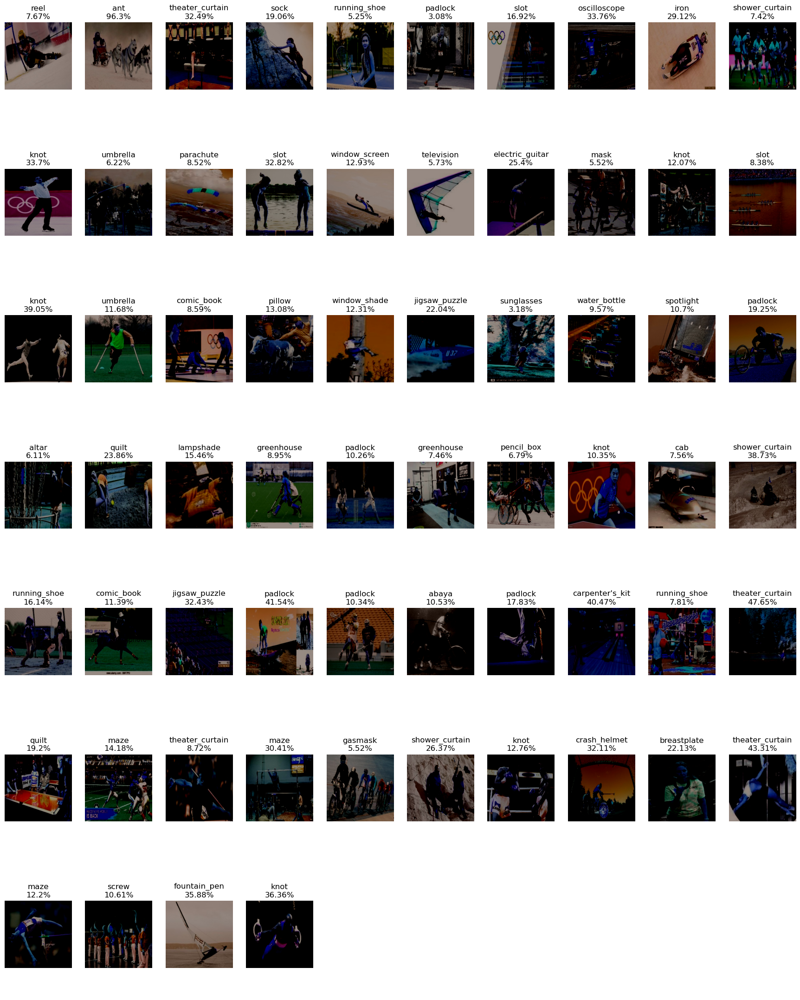

In [39]:
# 예측 모델 출력
print('mobilenet')
predict_and_display(files_batch, titles, 'mobilenet')

xception
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
[[('n03775546', 'mixing_bowl', 0.99999535), ('n03942813', 'ping-pong_ball', 4.613241e-06), ('n04149813', 'scoreboard', 1.10153886e-10), ('n04127249', 'safety_pin', 5.914153e-12), ('n04356056', 'sunglasses', 2.7955707e-17)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 980ms/step
[[('n04116512', 'rubber_eraser', 0.8660494), ('n03775546', 'mixing_bowl', 0.13395068), ('n03908714', 'pencil_sharpener', 6.227359e-10), ('n04127249', 'safety_pin', 2.7602975e-10), ('n03942813', 'ping-pong_ball', 3.603636e-11)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step
[[('n03942813', 'ping-pong_ball', 0.9999894), ('n03445777', 'golf_ball', 9.848404e-06), ('n04461696', 'tow_truck', 3.400777e-07), ('n03825788', 'nipple', 2.1164371e-07), ('n03775546', 'mixing_bowl', 8.2136815e-08)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step
[[('n03594945', 'jeep', 0.999835), ('n03825788', 'nipple', 6.2008505e-05), ('n02971356', 'carton', 4.553405e-05), ('n03942813', 'ping-pong_ball', 2.0907692e-05), ('n03763

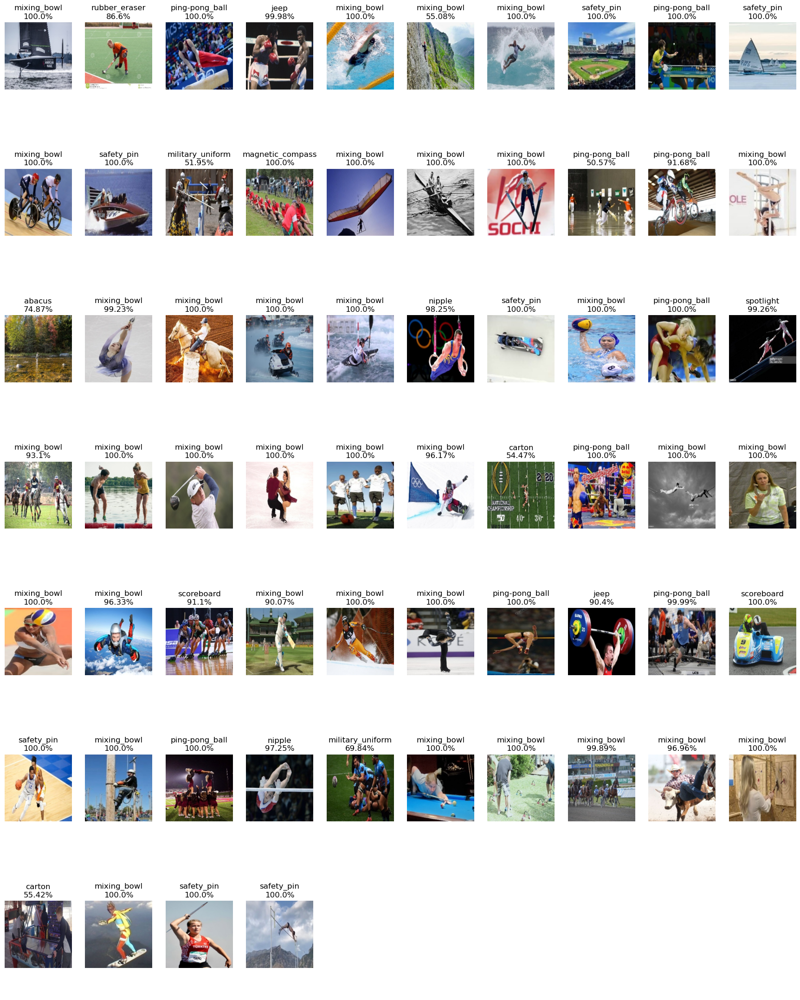

In [91]:
print('xception')
predict_and_display(files_batch, titles, 'xception')

resnet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
[[('n02089973', 'English_foxhound', 0.9994954), ('n07613480', 'trifle', 0.0005046269), ('n02123597', 'Siamese_cat', 3.8243137e-17), ('n01855032', 'red-breasted_merganser', 1.4771152e-28), ('n15075141', 'toilet_tissue', 0.0)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step
[[('n02089973', 'English_foxhound', 1.0), ('n02123597', 'Siamese_cat', 2.2181876e-18), ('n07613480', 'trifle', 9.10787e-19), ('n01855032', 'red-breasted_merganser', 5.702922e-22), ('n01688243', 'frilled_lizard', 6.2506154e-30)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step
[[('n02123597', 'Siamese_cat', 1.0), ('n02883205', 'bow_tie', 5.556537e-12), ('n01560419', 'bulbul', 1.619272e-13), ('n03944341', 'pinwheel', 5.0531957e-17), ('n04254777', 'sock', 1.3641544e-24)]]
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step
[[('n07613480', 'trifle', 0.9999999), ('n02883205', 'bow_tie', 1.1139393e-07), ('n02089973', 'English_foxhound', 2.057833e-29), ('n15075141', 'toilet_tissue', 0.0), ('n02317335', 'starfi

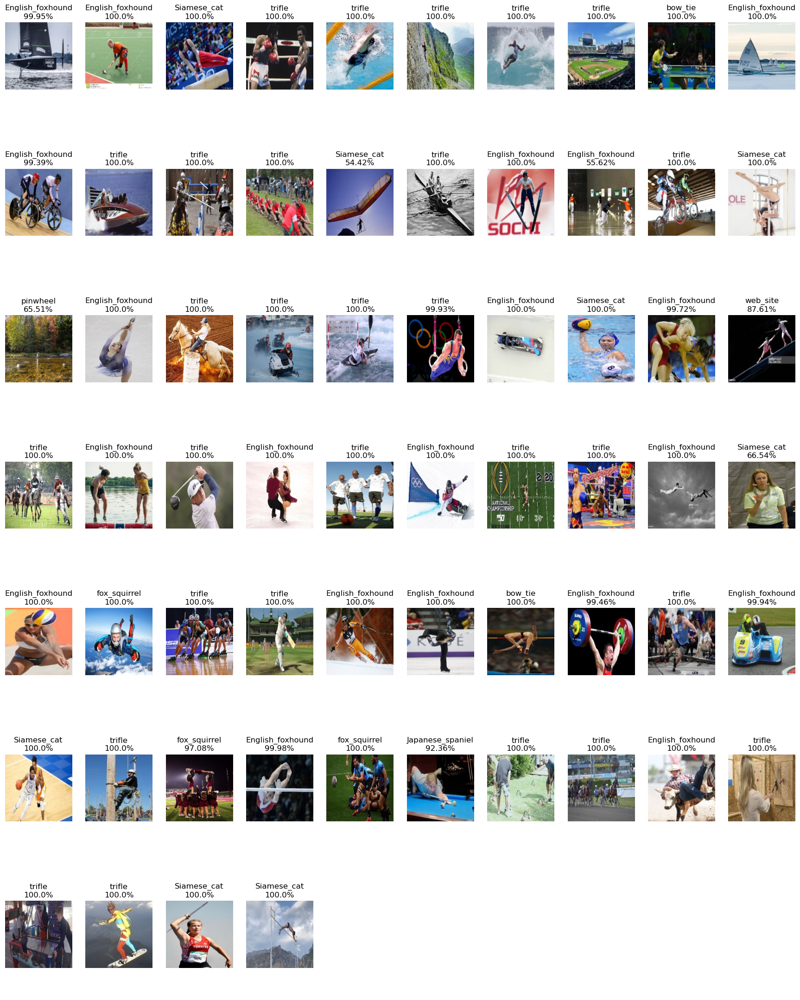

In [92]:
print('resnet50')
predict_and_display(files_batch, titles, 'resnet50')

# vgg 16 채택

In [104]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

IMAGE_SIZE = 64
BATCH_SIZE = 64

class Dataset(Sequence):
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, preprocess=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.preprocess = preprocess
        self.shuffle = shuffle

        if self.shuffle:
            # 에포크 종료 시, 객체 생성 및 데이터 섞기
            self.on_epoch_end()

    # __len__()는 전체 데이터 건수에서 batch_size 단위로 나눈 데이터 수
    # 예를 들어, 1000개의 데이터를 30 batch_size로 설정하면, 1 batch당 33.33..개이다.
    # 이 때, 소수점은 무조건 올려서 33 + 1 = 34개로 설정한다.
    def __len__(self):
        return int(np.ceil(len(self.targets) / self.batch_size))

    # batch_size 단위로 이미지 배열과 타켓 데이터들을 가져온 뒤 변환한 값을 리턴한다.
    def __getitem__(self, index):
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]

        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        for i in range(file_paths_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            if self.aug is not None:
                image = self.aug(image=image)['image']

            if self.preprocess is not None:
                image = self.preprocess(image)
                    
            results_batch[i] = image

        return results_batch, targets_batch
        
    def on_epoch_end(self):
        if self.shuffle:
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)        

In [105]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2 # 작은 장치에서도 성능을 끌어올릴 수 있는 모델

# 모델 생성 함수 선언
# model_name: 사전 훈련 모델 이름, verbose: 모델 요약 출력 여부
def create_model(model_name='vgg16', verbose=False):
    # Input layer: 이미지 크기와 채널 수를 지정
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    # VGG16 모델 선택
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    # ResNet50V2 모델 선택
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    # Xception 모델 선택
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    # MobileNetV2 모델 선택
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')

    # output layer: 모델 출력 층 
    x = model.output

    # 분류기
    # GlobalAveragePooling2D: 글로벌 평균 풀링 층을 추가하여 특성 맵의 공간 차원 축소
    x = GlobalAveragePooling2D()(x)
    # hidden layer: VGG16 모델 선택을 선택하지 않았다면 dropout 미진행
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)

    # hidden layer: 50개의 뉴런과 ReLU 활성화 함수 사용
    x = Dense(50, activation='relu')(x)

    # hidden layer: VGG16 모델 선택을 선택하지 않았다면 dropout 미진행
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)

    # output layer: 5개의 뉴런과 소프트맥스 활성화 함수를 사용하여 클래스 확률 출력
    output = Dense(100, activation='softmax', name='output')(x)

    # 모델 생성: 입력과 출력을 지정하여 모델 정의
    model = Model(inputs=input_tensor, outputs=output)

    # verbose가 True인 경우 모델 요약 출력
    if verbose:
        model.summary()
    
    return model

In [106]:
# 이미지 사이즈 및 배치 사이즈
IMAGE_SIZE = 128
BATCH_SIZE = 16

In [112]:
import albumentations as A
# preprocess_input 함수에 별칭 지정
# tensorflow와 torch 모두 같은 이름의 함수를 받기 때문에 별칭으로 구분
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_preprocess_input

# 데이터 경로 및 타겟 담기 (get_dummies를 통해 원-핫 인코딩 진행)
train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values # CategoricalCrossEntropy

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values # CategoricalCrossEntropy

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values # CategoricalCrossEntropy

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.5),
    # 좌우 반전
    A.HorizontalFlip(p=0.5),
    # 밝기 및 대비 변경
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=0.5)
])

# Dataset class로 객체 생성
train_dataset = Dataset(train_file_paths, train_targets, BATCH_SIZE, aug, vgg_preprocess_input, shuffle=True)
validation_dataset = Dataset(validation_file_paths, validation_targets, BATCH_SIZE, vgg_preprocess_input)
test_dataset = Dataset(test_file_paths, test_targets, BATCH_SIZE,vgg_preprocess_input)

In [113]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=2,
    mode='min'
)

In [114]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

# 모델 생성 함수를 사용하여 모델 생성
model = create_model(model_name='vgg16', verbose=True)

# 모델 컴파일: 학습 프로세스 설정
# optimizer: 최적화 알고리즘, loss: 손실함수, metrics: 성능지표
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_7           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 50)                  │          25,6

 Total params: 14,745,438 (56.25 MB)

 Trainable params: 14,745,438 (56.25 MB)

 Non-trainable params: 0 (0.00 B)

In [115]:
import gc

# 메모리 해제 함수
gc.collect()

2545

In [116]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 20

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Epoch 1/20
477/540 ━━━━━━━━━━━━━━━━━━━━ 2:04 2s/step - acc: 0.0132 - loss: 5.2792

UnknownError: Graph execution error:

Detected at node PyFunc defined at (most recent call last):
<stack traces unavailable>
error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'

Traceback (most recent call last):

  File "C:\ProgramData\anaconda3\Lib\site-packages\tensorflow\python\ops\script_ops.py", line 270, in __call__
    ret = func(*args)
          ^^^^^^^^^^^

  File "C:\ProgramData\anaconda3\Lib\site-packages\tensorflow\python\autograph\impl\api.py", line 643, in wrapper
    return func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^

  File "C:\ProgramData\anaconda3\Lib\site-packages\tensorflow\python\data\ops\from_generator_op.py", line 198, in generator_py_func
    values = next(generator_state.get_iterator(iterator_id))
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

  File "C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py", line 260, in _get_iterator
    for i, batch in enumerate(gen_fn()):

  File "C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py", line 253, in generator_fn
    yield self.py_dataset[i]
          ~~~~~~~~~~~~~~~^^^

  File "C:\Users\user\AppData\Local\Temp\ipykernel_54792\1489493570.py", line 36, in __getitem__
    image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^

cv2.error: OpenCV(4.9.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'



	 [[{{node PyFunc}}]]
	 [[IteratorGetNext]] [Op:__inference_one_step_on_iterator_81035]

In [ ]:
# 이미지 사이즈 및 배치 사이즈
IMAGE_SIZE = 128
BATCH_SIZE = 32

In [ ]:
import albumentations as A
# preprocess_input 함수에 별칭 지정
# tensorflow와 torch 모두 같은 이름의 함수를 받기 때문에 별칭으로 구분
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input

# 데이터 경로 및 타겟 담기 (get_dummies를 통해 원-핫 인코딩 진행)
train_file_paths = train_df['file_paths'].values
train_targets = pd.get_dummies(train_df['targets']).values # CategoricalCrossEntropy

validation_file_paths = validation_df['file_paths'].values
validation_targets = pd.get_dummies(validation_df['targets']).values # CategoricalCrossEntropy

test_file_paths = test_df['file_paths'].values
test_targets = pd.get_dummies(test_df['targets']).values # CategoricalCrossEntropy

# 이미지 변환 (증강)
aug = A.Compose([
    # 크기 조정 및 회전
    A.ShiftScaleRotate(p=0.5),
    # 좌우 반전
    A.HorizontalFlip(p=0.5),
    # 밝기 및 대비 변경
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=0.5)
])

# Dataset class로 객체 생성
train_dataset = create_dataset(train_file_paths, train_targets, BATCH_SIZE, 'vgg16', shuffle=True)
validation_dataset = create_dataset(validation_file_paths, validation_targets, BATCH_SIZE, 'vgg16', shuffle=False)
test_dataset = create_dataset(test_file_paths, test_targets, BATCH_SIZE, 'vgg16', shuffle=False)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# weights 저장
mcp_cb = ModelCheckpoint(
    filepath="./callback_files/1cycle/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습률 동적으로 감소
rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=2,
    mode='min'
)

# 일정 기간 동안 성능이 개선되지 않을 시 학습 조기 중단
ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=4,
    mode='min'
)

In [ ]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

# 모델 생성 함수를 사용하여 모델 생성
model = create_model(model_name='vgg16', verbose=True)

# 모델 컴파일: 학습 프로세스 설정
# optimizer: 최적화 알고리즘, loss: 손실함수, metrics: 성능지표
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

In [ ]:
import gc

# 메모리 해제 함수
gc.collect()

In [ ]:
# 반복횟수 지정
# 대문자로 상수를 표기하면 다른 부분에서 변경되지 않는다는 것을 의미
N_EPOCHS = 20

# 훈련
history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

In [ ]:
# 평가
model.evaluate(test_dataset)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 학습과정 지표를 그래프화
def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)